In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow.keras.backend as K

import scipy.stats as ss
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from easydict import EasyDict
from tqdm.notebook import tqdm,trange
from sklearn.metrics import roc_auc_score

In [2]:
from sklearn.linear_model import LogisticRegression

In [3]:
def LossFn(alpha):
    epsilon = 10e-10
    
    def loss_function(pos_out, unlabeled_out):
        loss_neg = -tf.reduce_mean(tf.math.log(1 - unlabeled_out + epsilon))
        loss_neg = tf.maximum(0.0, loss_neg + alpha * tf.reduce_mean(tf.math.log(1 - pos_out + epsilon)))
#         loss_neg = loss_neg + alpha * tf.reduce_mean(tf.math.log(1 - pos_out + epsilon))
        loss_neg = tf.abs(loss_neg + alpha * tf.reduce_mean(tf.math.log(1 - pos_out + epsilon)))
        loss_pos = -alpha * tf.reduce_mean(tf.math.log(pos_out + epsilon))
        return loss_neg + loss_pos,False
    return loss_function



In [194]:
def Loss(alpha, Beta=.25):
    
    def loss_function(pos_out, unlabeled_out):
        # Cross Entropy Loss
#         RuMinus = tf.reduce_mean(-tf.math.log(1-unlabeled_out))
#         RpMinus = tf.reduce_mean(-tf.math.log(1-pos_out))
#         RpPlus = tf.reduce_mean(-tf.math.log(pos_out))
        # Squared Error Loss
        RuMinus = tf.reduce_mean(tf.math.square(unlabeled_out))
        RpMinus = tf.reduce_mean(tf.math.square(pos_out))
        RpPlus = tf.reduce_mean(tf.math.square(1-pos_out))
        # Sigmoid Loss
#         RuMinus = tf.reduce_mean(tf.math.sigmoid(unlabeled_out))
#         RpMinus = tf.reduce_mean(tf.math.sigmoid(pos_out))
#         RpPlus = tf.reduce_mean(tf.math.sigmoid(-1 * pos_out))
        # Logistic Loss
#         RuMinus = tf.reduce_mean(tf.math.log(1 + tf.math.exp(unlabeled_out)))
#         RpMinus = tf.reduce_mean(tf.math.log(1 + tf.math.exp(pos_out)))
#         RpPlus = tf.reduce_mean(tf.math.log(1 + tf.math.exp(-1 * pos_out)))
        # Squared Loss
#         RuMinus = tf.reduce_mean(tf.math.pow(-unlabeled_out-1,2)/4)
#         RpMinus = tf.reduce_mean(tf.math.pow(-pos_out-1,2)/4)
#         RpPlus = tf.reduce_mean(tf.math.pow(pos_out-1,2)/4)
        # Hinge Loss
#         RuMinus = tf.reduce_mean(tf.maximum(1 + unlabeled_out, 0))
#         RpMinus = tf.reduce_mean(tf.maximum(1 + pos_out, 0))
#         RpPlus = tf.reduce_mean(tf.maximum(1 - pos_out, 0))
        

        return alpha * RpPlus, RuMinus - alpha * RpMinus,(RuMinus - alpha * RpMinus) < 0 
    return loss_function

In [4]:
# export
def batch(x, y, n_p, n_u):
    x_p, ix_p = batchPos(x, y, n_p)
    x_u, ix_u = batchUL(x, y, n_u)
    xx = np.concatenate((x_p, x_u), axis=0)
    ix = np.concatenate((ix_p, ix_u), axis=0)
    return xx, y[ix, :], x_p, x_u, ix


def batchPos(x, y, n_p):
    return batchY(x, y, 1, n_p)


def batchUL(x, y, n_u):
    return batchY(x, y, 0, n_u)

def batchY(x, y, value, n, *args):
    ix = (y == value).flatten( )
    ix_all = np.arange(np.size(y))
    ix = ix_all[ix]
    if args:
        p = args[0].flatten()
        p = p[ix]
        ix_p = bernoulli.rvs(p)
        ix_p = np.cast['bool'](ix_p)
        ix = ix[ix_p]
    ix = np.random.choice(ix, n, replace=True)
    xx = x[ix, :]
    return xx, ix

In [5]:
class Mixture:

    def __init__(self, components, mixing_proportion):
        self.comps = components
        self.mixProp = mixing_proportion

    def pdf(self, x):
        return np.add(*[pi * comp.pdf(x) for (comp,pi) in zip(self.comps, self.mixProp)])

    def cdf(self, x):
        return np.add((p * comp.cdf(x) for (comp, p) in zip(self.comps, self.mixProp)), axis=-1)

    def rvs(self, size):
        sizes = np.cast['int32'](np.floor(size * self.mixProp))
        #pdb.set_trace()
        delta = np.cast['int32'](size - np.sum(sizes))
        ix = np.random.choice(np.size(self.mixProp), size=delta, p=self.mixProp)
        for ii in ix:
            sizes[ii] = sizes[ii] + 1
        dim = np.size(self.comps[0].rvs(size=1))
        x = np.empty([0, dim])
        for (s, comp) in zip(sizes, self.comps):
            new = comp.rvs(size=[s, 1])
            if len(new.shape) == 1:
                new = np.expand_dims(new,1)
            x = np.concatenate((x,new), axis=0)
        #pdb.set_trace()
        return x

    def rvsCompInfo(self, size):
        sizes = np.cast['int32'](np.floor(size * self.mixProp))
        #pdb.set_trace()
        delta = np.cast['int32'](size - np.sum(sizes))
        ix = np.random.choice(np.size(self.mixProp), size=delta, p=self.mixProp)
        for ii in ix:
            sizes[ii] = sizes[ii] + 1
        dim = np.size(self.comps[0].rvs(size=1))
        x = np.empty([0, dim])
        y = np.empty([0, 1])
        k = 0
        for (s, comp) in zip(sizes, self.comps):
            new = comp.rvs(size=[s, 1])
            print(x.shape, new.shape)
            x = np.concatenate((x, new), axis=0)
            y = np.concatenate((y, np.zeros([s, 1]) + k), axis=0)
            k = k + 1
        #pdb.set_trace()
        return x, y

    def component_pdfs(self, x):
        return (comp.pdf(x) for comp in self.comps)


In [202]:
NLP=100
NUP = 5000
NN = 5000
DIM = 64
ZDIM = max(1,int(DIM/2))
OFFSET = .125

classPrior = NUP / (NUP + NN)
# f0 = ss.multivariate_normal(np.zeros(DIM) + OFFSET,np.eye(DIM))
# f1 = ss.multivariate_normal(np.zeros(DIM) - OFFSET,np.eye(DIM))
f0 = Mixture([
    ss.multivariate_normal(np.zeros(DIM) + OFFSET,np.eye(DIM)),
    ss.multivariate_normal(np.zeros(DIM) +  OFFSET, np.eye(DIM))
],[.5,.5])
f1 = Mixture([
    ss.multivariate_normal(np.zeros(DIM) - OFFSET,np.eye(DIM)),
    ss.multivariate_normal(np.zeros(DIM) - OFFSET, np.eye(DIM))
],[.5,.5])
posterior = lambda x: classPrior * f1.pdf(x).ravel() / (classPrior * f1.pdf(x).ravel() + (1 - classPrior) * f0.pdf(x).ravel())

xUnlabeled = np.concatenate((f0.rvs(NN),f1.rvs(NUP)))
yPN = np.concatenate((np.zeros(NN),
                    np.ones(NUP))).astype(bool)
xPos = f1.rvs(NLP)


xPosTrain, xPosVal = train_test_split(xPos,test_size=.1)
xUnlabeledTrain,xUnlabeledVal,yPNTrain,yPNVal = train_test_split(xUnlabeled,yPN,test_size=.1)

In [203]:
roc_auc_score(yPNVal,posterior(xUnlabeledVal))

0.9326519999999999

In [204]:
if DIM == 1:
    rng = np.arange(-5,5,.1)
    plt.plot(rng, f0.pdf(rng))
    plt.plot(rng, f1.pdf(rng))
    plt.plot(rng,posterior(rng))

In [205]:
def cross_entropy_with_logits(logits, targets):
    log_prob = tf.nn.log_softmax(logits)
    return -tf.reduce_mean(tf.reduce_sum(targets * log_prob, 1))

In [206]:
latentOffset = 0.25
testLatentInputs=np.concatenate([
                np.random.multivariate_normal(np.zeros(ZDIM) - latentOffset, np.eye(ZDIM),size=1000),
                np.random.multivariate_normal(np.zeros(ZDIM) + latentOffset, np.eye(ZDIM),size=1000),
            ],axis=0)
latentF0 =ss.multivariate_normal(np.zeros(ZDIM) + latentOffset,np.eye(ZDIM))
latentF1 = ss.multivariate_normal(np.zeros(ZDIM) - latentOffset, np.eye(ZDIM))
latentPosterior = lambda x: (latentF1.pdf(x) * classPrior) / (latentF1.pdf(x) * classPrior + (1 - classPrior) * latentF0.pdf(x))
testLatentLabels = np.concatenate([
    np.ones(1000),
    np.zeros(1000)
])

# latentPosterior(testLatentInputs)
roc_auc_score(testLatentLabels,latentPosterior(testLatentInputs))

0.971498

In [215]:
######################### DISCRIMINATOR ############################
pos_disc_inputs = keras.Input(shape=ZDIM,name="pos_disc_inputs")
modellayers = keras.models.Sequential([
    layers.Dense(128, activation="relu"),
    layers.Dense(128, activation="relu"),
    layers.Dense(128, activation="relu")
])
pos_disc_out = layers.Dense(1,activation="sigmoid",name="pos_disc_out")(modellayers(pos_disc_inputs))
discriminator = keras.Model([pos_disc_inputs],
                            [pos_disc_out],name="discriminator")
print(discriminator.summary())
################### ENCODER #####################################
encoder_inputs = keras.Input(shape=DIM,name="encoder_inputs")
encoder_layers = keras.models.Sequential([
    layers.Dense(128, activation="relu"),
    layers.Dense(128, activation="relu"),
    layers.Dense(128, activation="relu")
])
encoder_output = layers.Dense(ZDIM,activation=None,name="encoder_output")(encoder_layers(encoder_inputs))
encoder = keras.Model([encoder_inputs],
                            [encoder_output],name="encoder")
print(encoder.summary())
################# ADVERSARY ###################################
adversary_input = keras.Input(shape=ZDIM,name="pos_disc_inputs")
adversary_layers = keras.models.Sequential([
    layers.Dense(128, activation="relu"),
    layers.Dense(128, activation="relu"),
    layers.Dense(128, activation="relu")
])
adversary_out = layers.Dense(1,activation=None,name="adversary_out")(adversary_layers(adversary_input))
adversary = keras.Model([adversary_input],
                            [adversary_out],name="adversary")
print(adversary.summary())

############## DECODER ####################################
decoder_input = keras.Input(shape=ZDIM,name="decoder_input")
decoder_layers = keras.models.Sequential([
    layers.Dense(128, activation="relu"),
    layers.Dense(128, activation="relu"),
    layers.Dense(128, activation="relu")
])
decoder_out = layers.Dense(DIM,activation=None,name="decoder_out")(decoder_layers(decoder_input))
decoder = keras.Model([decoder_input],
                            [decoder_out],name="decoder_out")
print(decoder.summary())

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 pos_disc_inputs (InputLayer  [(None, 32)]             0         
 )                                                               
                                                                 
 sequential_43 (Sequential)  (None, 128)               37248     
                                                                 
 pos_disc_out (Dense)        (None, 1)                 129       
                                                                 
Total params: 37,377
Trainable params: 37,377
Non-trainable params: 0
_________________________________________________________________
None
Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder_inputs (InputLayer)  [(None, 64)]             0         
                           

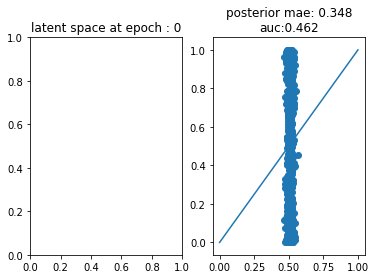

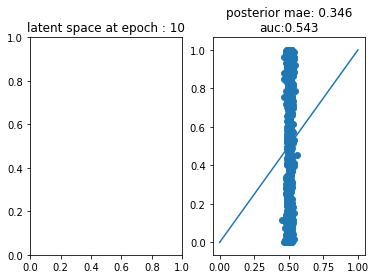

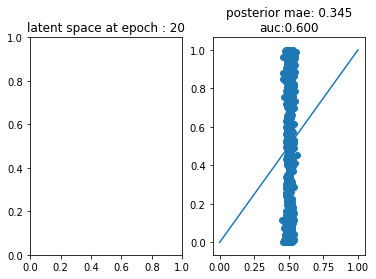

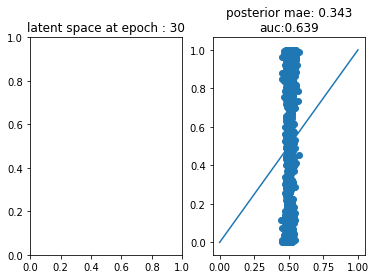

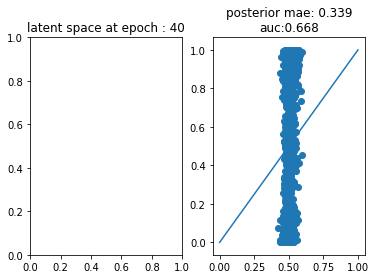

...

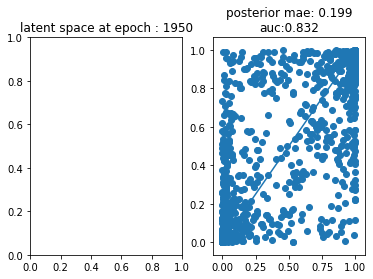

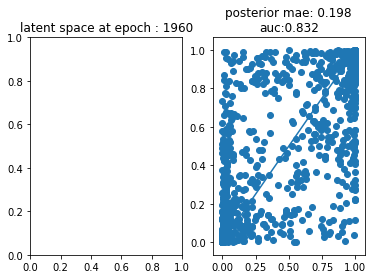

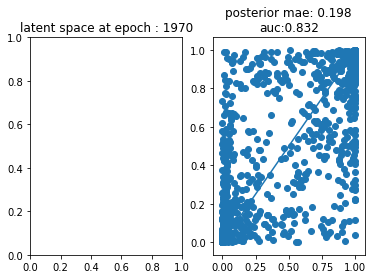

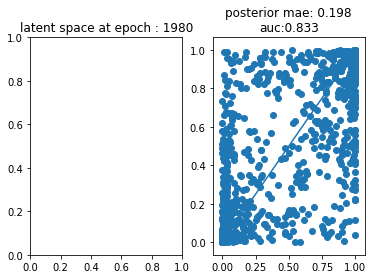

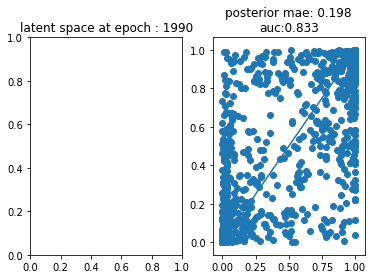

In [216]:
opt = tf.keras.optimizers.Adam(learning_rate=1e-4)
opt1 = tf.keras.optimizers.Adam(learning_rate=1e-4)
opt2 = tf.keras.optimizers.Adam(learning_rate=1e-4)
opt3 = tf.keras.optimizers.Adam(learning_rate=1e-4)
NEpochs = 2000
FREEZE_ENCODER_EPOCH = NEpochs
LRDECAYFACTOR = 10
lossFn= Loss(classPrior)
posteriorMAEs= []
aucs = []
mse = tf.keras.losses.MeanSquaredError()
for epoch in trange(NEpochs):
    if epoch > 0 and not epoch % NEpochs: 
        opt.lr.assign(opt.lr/LRDECAYFACTOR)
        opt1.lr.assign(opt1.lr/LRDECAYFACTOR)
        opt2.lr.assign(opt2.lr/LRDECAYFACTOR)
        opt3.lr.assign(opt3.lr/LRDECAYFACTOR)
    ############# SAMPLE DATA ###########################
    _,y_pu,x_p,x_u, _ = batch(np.concatenate((xPosTrain,xUnlabeledTrain)),
                           np.concatenate((np.ones(xPosTrain.shape[0]),
                                           np.zeros(xUnlabeledTrain.shape[0])))[:,None],128,128)
    ################### AE STEP #########################
    with tf.GradientTape() as tape:
        out_pos = decoder(encoder(x_p))
        out_unlabeled = decoder(encoder(x_u))
        total_loss = mse(x_p, out_pos)
        total_loss += mse(x_u,out_unlabeled)
    grads = tape.gradient(total_loss, encoder.trainable_variables + decoder.trainable_variables)
    opt.apply_gradients(zip(grads, encoder.trainable_variables + decoder.trainable_variables))
    ################ NNPU STEP ##########################
    with tf.GradientTape() as tape:
        out_pos = discriminator(encoder(x_p))
        out_unlabeled = discriminator(encoder(x_u))
        pos_loss,neg_loss,applyDiscount = lossFn(out_pos,out_unlabeled)
        total_loss = pos_loss + tf.maximum(0,neg_loss)
    if applyDiscount:
        opt1.lr.assign(opt.lr/2)
    if epoch < FREEZE_ENCODER_EPOCH:
        grads = tape.gradient(total_loss,encoder.trainable_variables + discriminator.trainable_variables)
        opt1.apply_gradients(zip(grads,encoder.trainable_variables + discriminator.trainable_variables))
    else:
        grads = tape.gradient(total_loss,discriminator.trainable_variables)
        opt1.apply_gradients(zip(grads, discriminator.trainable_variables))
    if applyDiscount:
        opt1.lr.assign(opt.lr * 2)
    if epoch < FREEZE_ENCODER_EPOCH:
        ################# Generator Step ####################
        with tf.GradientTape() as tape:
            #pos_adversary_decisions = adversary(encoder(x_p))
            unlabeled_adversary_decisions = adversary(encoder(x_u))
            generator_loss = cross_entropy_with_logits(unlabeled_adversary_decisions, tf.ones(x_u.shape[0]))
#             generator_loss += cross_entropy_with_logits(pos_adversary_decisions, tf.ones(x_p.shape[0]))
        grads =tape.gradient(generator_loss,encoder.trainable_variables)
        opt2.apply_gradients(zip(grads, encoder.trainable_variables))
        ################# Adversary Step ####################
        with tf.GradientTape() as tape:
            real_inputs = np.concatenate([
                np.random.multivariate_normal(np.zeros(ZDIM) + latentOffset, np.eye(ZDIM),size=1000),
                np.random.multivariate_normal(np.zeros(ZDIM) - latentOffset, np.eye(ZDIM),size=1000),
            ],axis=0)
            real_adversary_decisions = adversary(real_inputs)
            unlabeled_adversary_decisions = adversary(encoder(x_u))
            #pos_adversary_decisions = adversary(encoder(x_p))
            fake_loss = cross_entropy_with_logits(unlabeled_adversary_decisions, tf.zeros(x_u.shape[0]))
            #fake_loss += cross_entropy_with_logits(pos_adversary_decisions,tf.zeros(x_p.shape[0]))
            real_loss = cross_entropy_with_logits(real_adversary_decisions, tf.ones(real_inputs.shape[0]))
            loss = real_loss + fake_loss
        grads =tape.gradient(loss,adversary.trainable_variables)
        opt3.apply_gradients(zip(grads, adversary.trainable_variables))
    if not epoch % 10:
        encOut = encoder.predict(xUnlabeledVal)
        xUnlabeledValPosts = discriminator.predict(encOut)
        fig,ax = plt.subplots(1,2)
        ax[1].scatter(xUnlabeledValPosts,posterior(xUnlabeledVal))
        ax[1].plot([0,1],[0,1])
        pmae=  np.mean(np.abs(xUnlabeledValPosts.ravel() - posterior(xUnlabeledVal).ravel()))
        auc = roc_auc_score(yPNVal,xUnlabeledValPosts)
        posteriorMAEs.append(pmae)
        aucs.append(auc)
        ax[1].set_title("posterior mae: {:.3f}\nauc:{:.3f}".format(pmae,auc))
        if ZDIM == 2:
            ax[0].scatter(*encOut.T,c=yPNVal)
        ax[0].set_title("latent space at epoch : {}".format(epoch))
        plt.show()

Text(0.5, 1.0, 'AUC : (max at epoch 1990 : 0.833)')

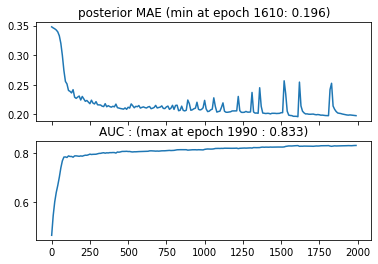

In [217]:
fig,ax = plt.subplots(2,1,sharex=True)
ax[0].plot(np.arange(0,len(posteriorMAEs) * 10, 10), posteriorMAEs)
ax[1].plot(np.arange(0,len(aucs) * 10, 10), aucs)
ax[0].set_title("posterior MAE (min at epoch {}: {:.3f})".format(np.argmin(posteriorMAEs) * 10,np.min(posteriorMAEs)))
ax[1].set_title("AUC : (max at epoch {} : {:.3f})".format(np.argmax(aucs) * 10, np.max(aucs)))

# Baseline

$f(x)^2 === -log(1 - f(x))$

$(1 - f(x))^2 === -log(f(x))$

cross entropy : $-(ylog(p) + (1-y)log(1-p))$

$-(y$

In [233]:
baseline_inputs = keras.Input(shape=DIM,name="baseline_inputs")
baselinelayers = keras.models.Sequential([
    layers.Dense(32),
    layers.BatchNormalization(),
    layers.Activation("relu"),
    layers.Dense(32),
    layers.BatchNormalization(),
    layers.Activation("relu"),
    layers.Dense(32),
    layers.BatchNormalization(),
    layers.Activation("relu"),
])
baseline_output = layers.Dense(1,activation="sigmoid",name="baseline_output")(baselinelayers(baseline_inputs))
baselineModel = keras.Model([baseline_inputs],
                            [baseline_output],name="baselineModel")
baselineModel.summary()


Model: "baselineModel"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 baseline_inputs (InputLayer  [(None, 64)]             0         
 )                                                               
                                                                 
 sequential_52 (Sequential)  (None, 32)                4576      
                                                                 
 baseline_output (Dense)     (None, 1)                 33        
                                                                 
Total params: 4,609
Trainable params: 4,417
Non-trainable params: 192
_________________________________________________________________


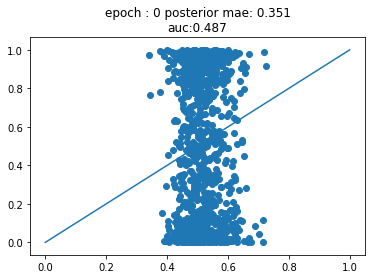

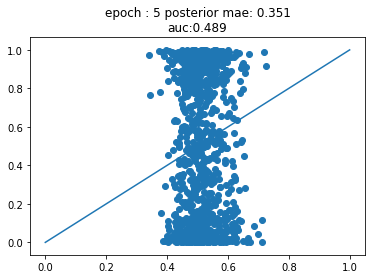

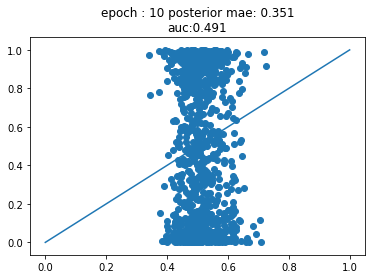

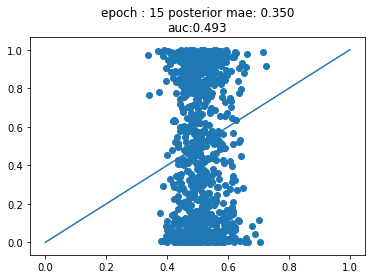

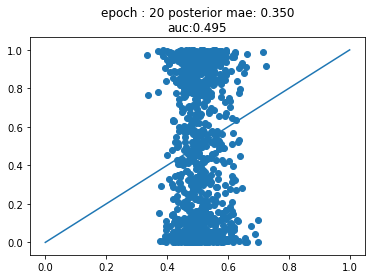

...

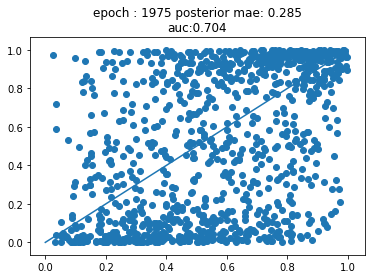

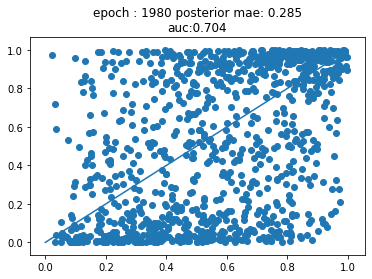

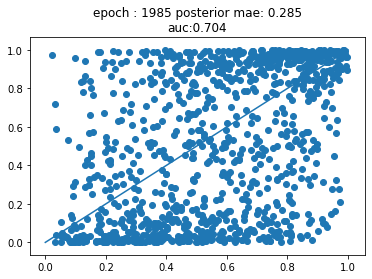

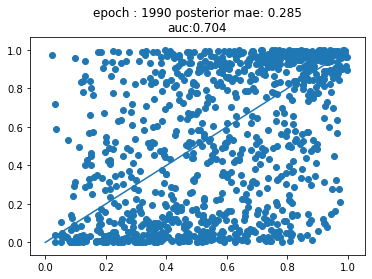

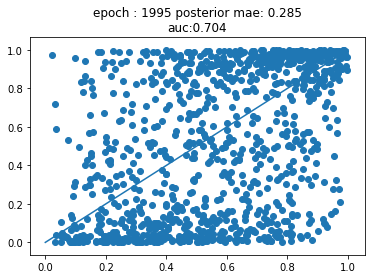

In [234]:
opt = tf.keras.optimizers.Adam(learning_rate=1e-4)
baselinePosteriorMAEs = []
baselineAUCs = []
lossFn= Loss(classPrior,Beta=0)
posLosses = []
negLosses = []
USEMIXUP = False
USEABS = False
mixupLosses = []
batchSize= 128
trainScores = np.zeros_like(yPNTrain)
NEPOCHS = 2000
PLOTEVERY = 5
minLoss, patience = np.inf, 0
for epoch in trange(NEPOCHS):
    if epoch > 0 and not epoch % NEPOCHS:
        opt.lr.assign(opt.lr/LRDECAYFACTOR)
    xx,yy,x_p,x_u, ix = batch(np.concatenate((xPosTrain,xUnlabeledTrain)),
                           np.concatenate((np.ones(xPosTrain.shape[0]),
                                           np.zeros(xUnlabeledTrain.shape[0])))[:,None],batchSize,batchSize)
    if USEMIXUP:
        unlabeledIX = (ix-xPosTrain.shape[0])[-batchSize:]
        unlabeledScores = trainScores[unlabeledIX]
        betas = np.random.beta(2,2,size=(batchSize,1))
        idx1 = np.random.choice(np.arange(batchSize),size=batchSize)
        idx2 = np.random.choice(np.arange(batchSize),size=batchSize)
        mixupX = betas * x_u[idx1] + (1-betas) * x_u[idx2]
        mixupY = betas * trainScores[idx1] + (1-betas) * trainScores[idx2]
    with tf.GradientTape() as tape:
        out_pos = baselineModel(x_p)
        out_unlabeled = baselineModel(x_u)
        if USEMIXUP:
            mixupOut = baselineModel(mixupX)
            mixupLoss = tf.reduce_mean(tf.math.abs(mixupOut - mixupY)) 
        posLoss, negLoss,applyDiscount = lossFn(out_pos, out_unlabeled)
        if USEABS:
            total_loss = posLoss + tf.abs(negLoss)
        else:
            total_loss = posLoss + tf.maximum(0,negLoss)
        if USEMIXUP:
            total_loss += 0.1 * mixupLoss
    posLosses.append( posLoss.numpy())
    negLosses.append(tf.abs(negLoss).numpy())
    if USEMIXUP:
        mixupLosses.append(mixupLoss.numpy())
    grads = tape.gradient(total_loss,baselineModel.trainable_variables)
    if not USEABS and applyDiscount:
        opt.lr.assign(opt.lr * .5)
    opt.apply_gradients(zip(grads,baselineModel.trainable_variables))
    if not USEABS and applyDiscount:
        opt.lr.assign(opt.lr * 2)
    if USEMIXUP:
        trainScores = baselineModel.predict(xUnlabeledTrain)
    if total_loss < minLoss:
        minLoss = total_loss.numpy()
        patience = 0
    else:
        patience += 1
    if patience == NEPOCHS:
        break
    if not epoch % PLOTEVERY:
        xUnlabeledValPosts = baselineModel.predict(xUnlabeledVal)
        plt.scatter(xUnlabeledValPosts,posterior(xUnlabeledVal))
        plt.plot([0,1],[0,1])
        pmae= np.mean(np.abs(xUnlabeledValPosts.ravel() - posterior(xUnlabeledVal).ravel()))
        auc = roc_auc_score(yPNVal,xUnlabeledValPosts)
        baselinePosteriorMAEs.append(pmae)
        baselineAUCs.append(auc)
        plt.title("epoch : {} posterior mae: {:.3f}\nauc:{:.3f}".format(epoch,pmae,auc))
        plt.show()

Text(0.5, 1.0, 'AUC : (max at epoch 1995 : 0.704)')

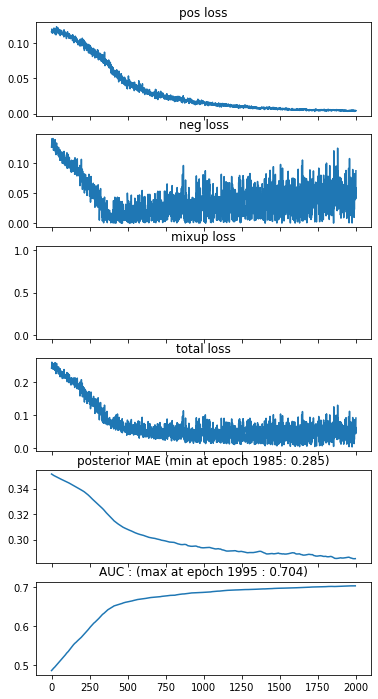

In [235]:
fig,ax = plt.subplots(6,1,sharex=True,figsize=(6,12))
ax[0].plot(posLosses)
ax[0].set_title("pos loss")
ax[1].plot(negLosses)
ax[1].set_title("neg loss")
ax[2].plot(mixupLosses)
ax[2].set_title("mixup loss")
TL = np.array(posLosses) + np.array(negLosses)
if USEMIXUP:
    TL +=  np.array(mixupLosses)
ax[3].plot(TL)
ax[3].set_title("total loss")
ax[4].plot(np.arange(0,len(baselinePosteriorMAEs) * PLOTEVERY, PLOTEVERY), baselinePosteriorMAEs)
ax[5].plot(np.arange(0,len(baselineAUCs) * PLOTEVERY, PLOTEVERY), baselineAUCs)
ax[4].set_title("posterior MAE (min at epoch {}: {:.3f})".format(np.argmin(baselinePosteriorMAEs) * PLOTEVERY,np.min(baselinePosteriorMAEs)))
ax[5].set_title("AUC : (max at epoch {} : {:.3f})".format(np.argmax(baselineAUCs) * PLOTEVERY, np.max(baselineAUCs)))